In [5]:
import os
import sys
#sys.path.append('/home/cjw/Code/DeepLearning')

import tensorflow as tf
import numpy as np
import pandas as pd

from autoencoder import autoencoder_train
from autoencoder import network
from autoencoder import utils

In [6]:
#datadir = "/v/Data/cyto/ChannelOne/"
datadir = "/media/cjw/Data/cyto/mmFromTifs3"

mmfiles = utils.list_mmfiles(datadir)
print(mmfiles)

mmdict = dict()

n_all_images = 0
for mmfilename in mmfiles:
#mmfilename = datadir + "Fish6_15_cjw_mean_zero.mm"
#mmfilename = datadir + "mmplate15-1.mm"
    mmheader = np.memmap(mmfilename, dtype="int32", mode='r',
                    shape=(4,))

    header_shape = mmheader.shape
    print(header_shape, mmheader)
    xshape = [mmheader[0], mmheader[1], mmheader[2], mmheader[3]]
    xshape = tuple(xshape)
    del mmheader
    n_all_images += xshape[0]
    
    m3 = np.memmap(mmfilename, dtype='float32', offset=128,
              mode='r', shape=xshape)
    key = mmfilename.split("/")[-1]
    mmdict[key] = m3

print(n_all_images)
mmdict.keys()

['/media/cjw/Data/cyto/mmFromTifs3/Fish6_Untreated.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_ICE.mm', '/media/cjw/Data/cyto/mmFromTifs3/Fish6_CCB.mm']
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
(4,) [10000    64    64     5]
30000


dict_keys(['Fish6_Untreated.mm', 'Fish6_ICE.mm', 'Fish6_CCB.mm'])

In [7]:
n = xshape[0]
all_ids =  range(n_all_images)
idx = 0
dataframes = list()
for key in mmdict.keys():
    mm = mmdict[key]
    n = mm.shape[0]
    print(n)
    file = n*[key[0:-3]]
    fid = range(n)
    mmfile = n*[key]
    plate = n*[0]
    row = n*[0]
    column = n*[0]
    field = n*[0]
    yc = n*[32]
    xc = n*[32]
    well = n*[0]
    ids = all_ids[idx:idx + n]
    idx += n
    df = pd.DataFrame({'id':ids, 'fid':fid, 'file':file, 'mmfile':mmfile, 'plate':plate,
                     'row':row, 'column':column, 'field':field,
                      'yc':yc, 'xc':xc, 'well':well})

    dataframes.append(df)
    
p_df = pd.concat(dataframes, ignore_index=True)

10000
10000
10000


Encoder True
[<tf.Tensor 'Placeholder:0' shape=(?, 32, 32, 4) dtype=float32>, <tf.Tensor 'dropout/mul:0' shape=(?, 16, 16, 128) dtype=float32>, <tf.Tensor 'dropout_1/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_2/mul:0' shape=(?, 4, 4, 512) dtype=float32>] Tensor("latent_space/BiasAdd:0", shape=(?, 352), dtype=float32)
isize:  4 32
dh0 (?, 32, 32, 4)
[<tf.Tensor 'dropout_3/mul:0' shape=(?, 8192) dtype=float32>, <tf.Tensor 'Reshape:0' shape=(?, 4, 4, 512) dtype=float32>, <tf.Tensor 'dropout_4/mul:0' shape=(?, 8, 8, 256) dtype=float32>, <tf.Tensor 'dropout_5/mul:0' shape=(?, 16, 16, 128) dtype=float32>] Tensor("Minimum:0", shape=(?, 32, 32, 4), dtype=float32)
Tensor("Mean_1:0", shape=(), dtype=float32) Tensor("Mean_2:0", shape=(), dtype=float32) Tensor("add_5:0", shape=(), dtype=float32)
30000 234 128
Epoch:  0 Iteration:  0 Loss:  610.147 2.81173 0.289332


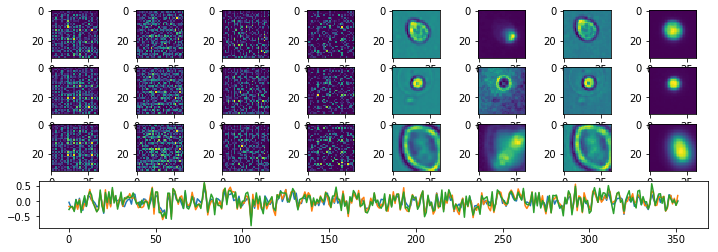

Epoch:  1 Iteration:  0 Loss:  17.8075 0.637583 0.000867367


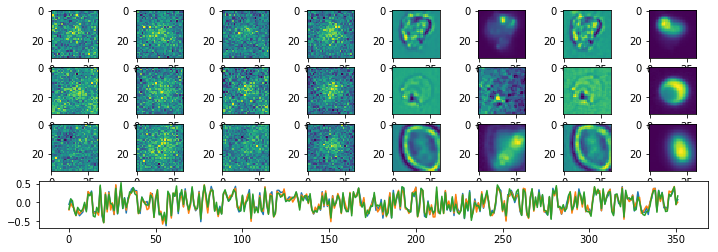

Epoch:  2 Iteration:  0 Loss:  14.8704 0.635959 0.00156772


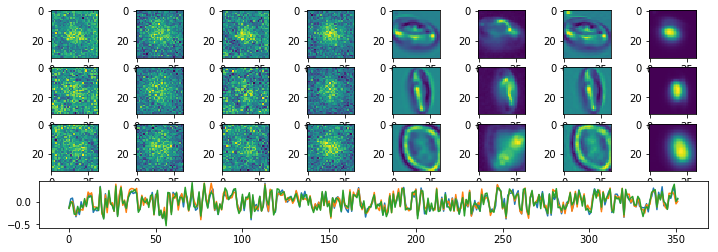

Epoch:  3 Iteration:  0 Loss:  13.7914 0.635435 0.00267345


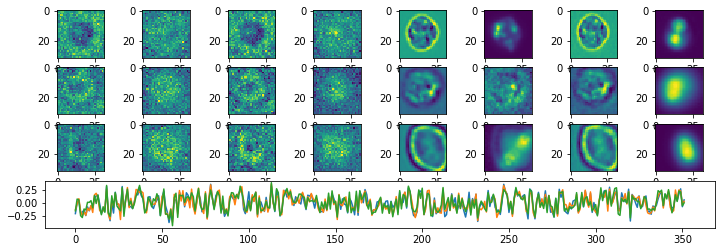

Epoch:  4 Iteration:  0 Loss:  11.5326 0.634236 0.00178719


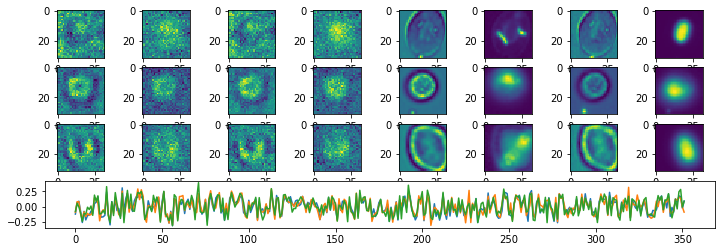

Epoch:  5 Iteration:  0 Loss:  12.4049 0.634737 0.00268349


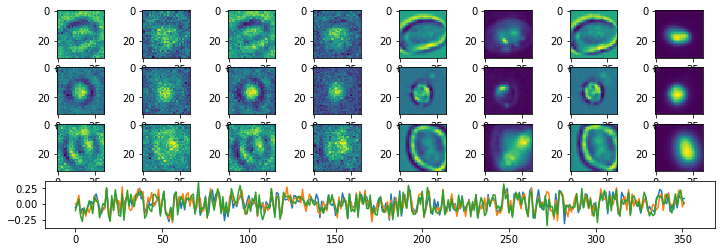

Epoch:  6 Iteration:  0 Loss:  9.23296 0.633026 0.00145829


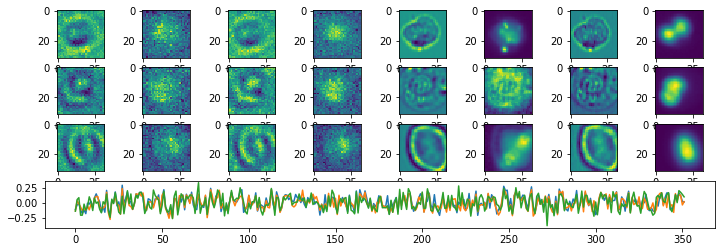

Epoch:  7 Iteration:  0 Loss:  8.55869 0.632669 0.00174612


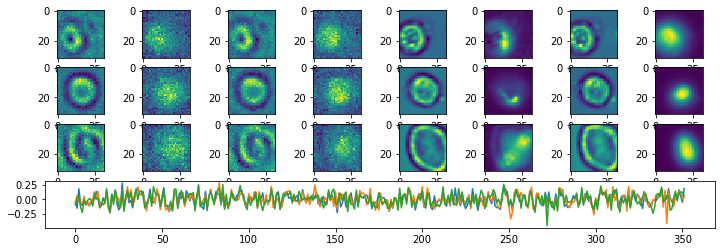

Epoch:  8 Iteration:  0 Loss:  8.26638 0.632513 0.00207677


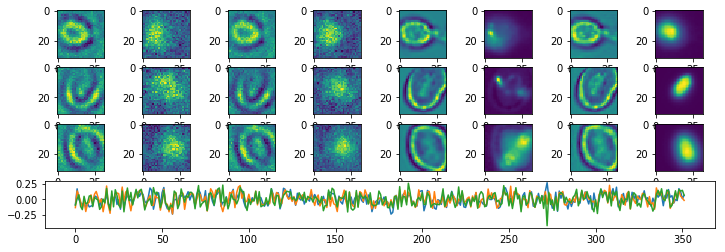

Epoch:  9 Iteration:  0 Loss:  7.69034 0.632199 0.000101805


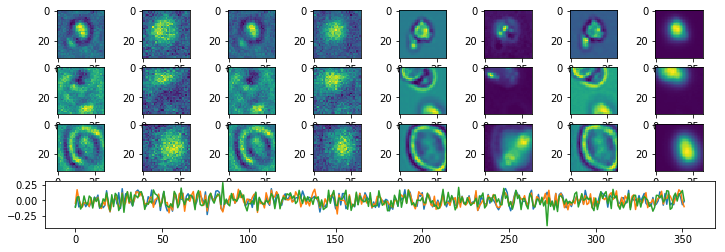

Epoch:  10 Iteration:  0 Loss:  6.91697 0.6318 0.0011864


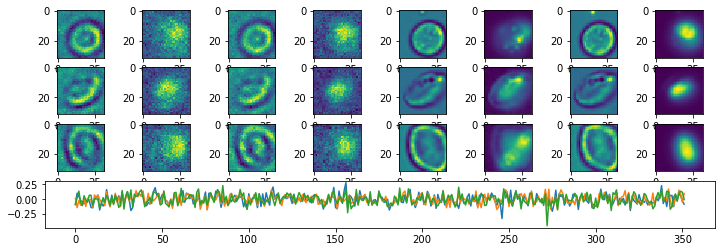

Epoch:  11 Iteration:  0 Loss:  6.91662 0.631797 0.0019722


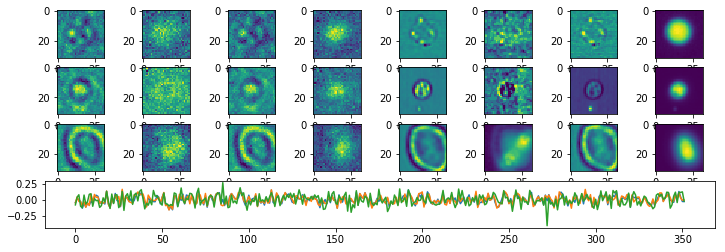

Epoch:  12 Iteration:  0 Loss:  6.31196 0.631483 0.00126341


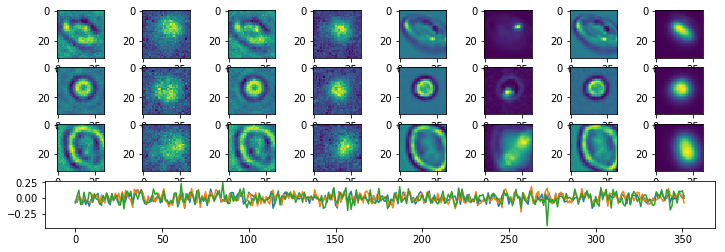

Epoch:  13 Iteration:  0 Loss:  6.07337 0.631356 0.00118837


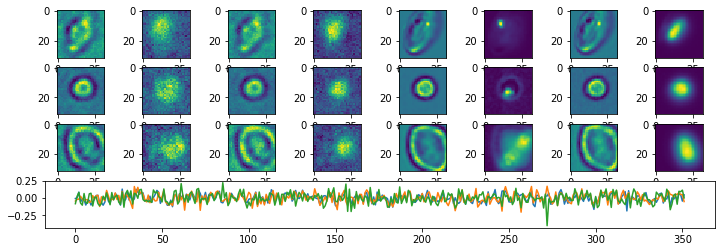

Epoch:  14 Iteration:  0 Loss:  5.8931 0.631262 0.000984818


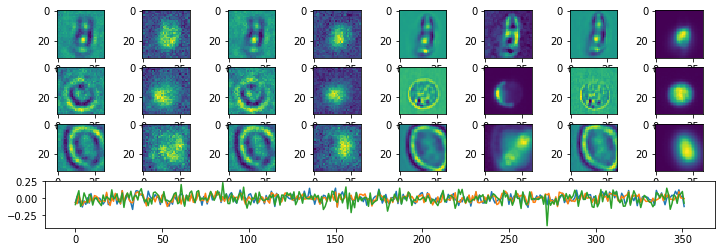

Epoch:  15 Iteration:  0 Loss:  5.63534 0.631123 0.00081417


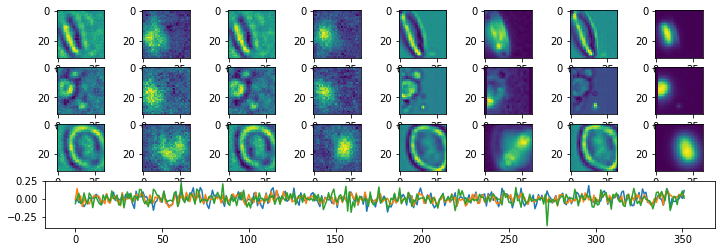

Epoch:  16 Iteration:  0 Loss:  5.39099 0.630991 0.000961602


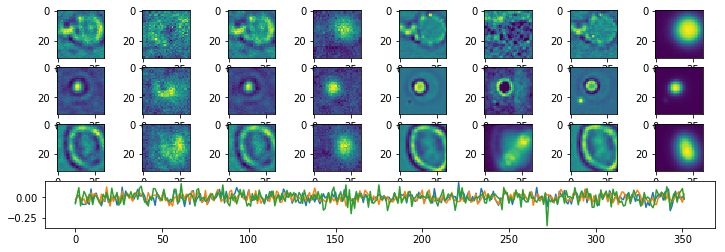

Epoch:  17 Iteration:  0 Loss:  5.20702 0.630897 0.000753999


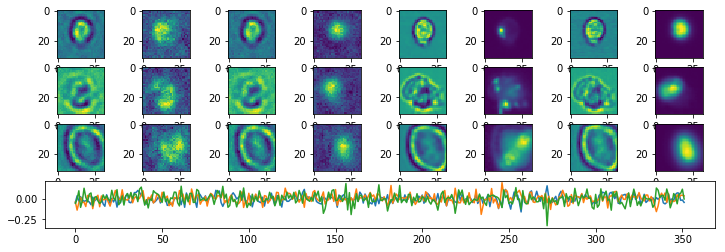

Epoch:  18 Iteration:  0 Loss:  5.03385 0.630802 0.00100991


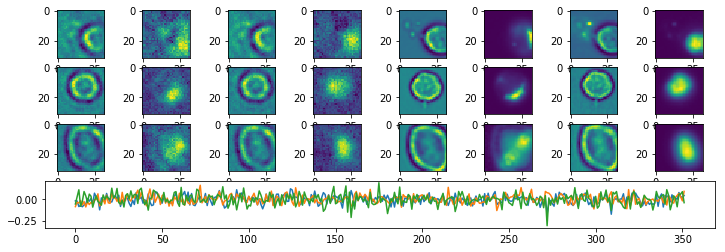

Epoch:  19 Iteration:  0 Loss:  4.8714 0.630716 0.000806153


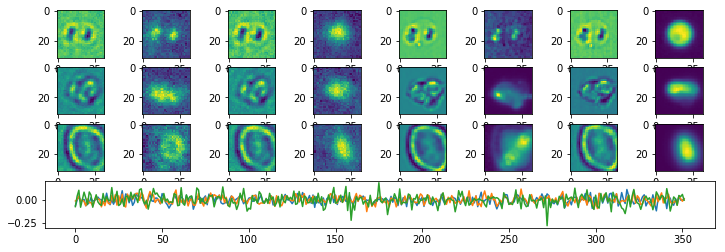

Epoch:  20 Iteration:  0 Loss:  4.74444 0.630649 0.000496984


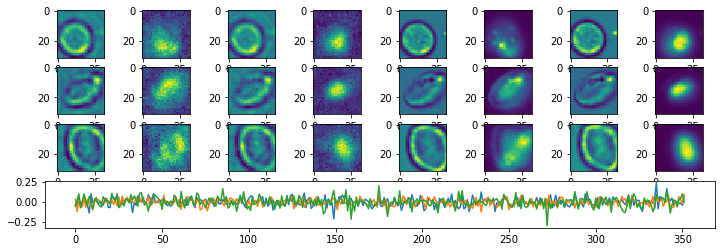

Epoch:  21 Iteration:  0 Loss:  4.61625 0.630582 0.000693887


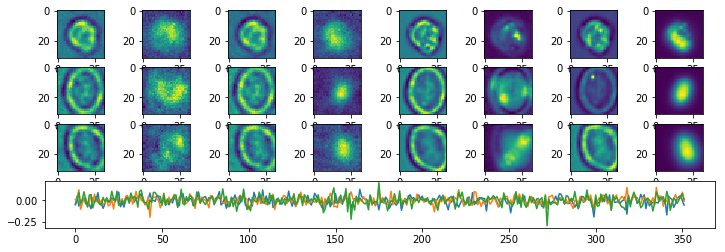

Epoch:  22 Iteration:  0 Loss:  4.51137 0.630526 0.000558853


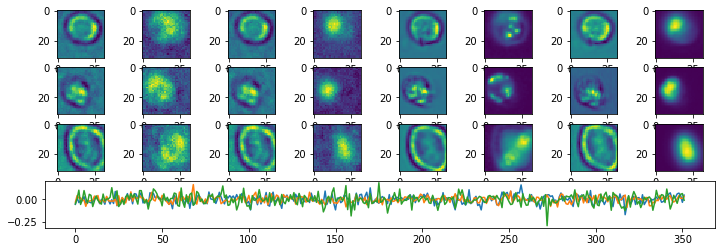

Epoch:  23 Iteration:  0 Loss:  4.48673 0.630514 0.00027734


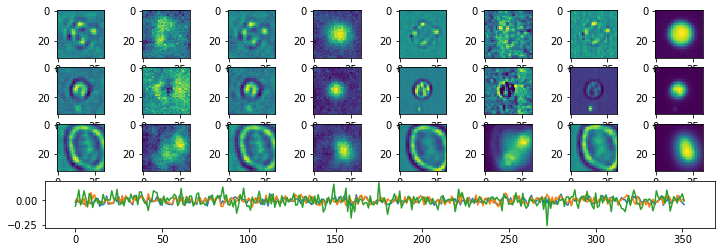

Epoch:  24 Iteration:  0 Loss:  4.33423 0.630431 0.00051102


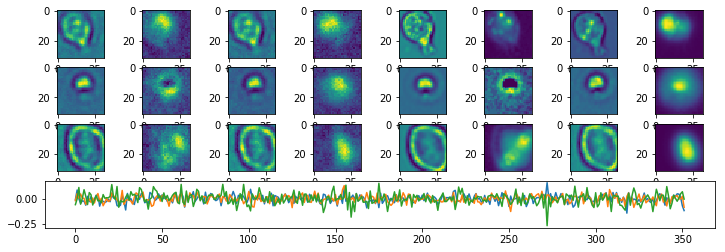

Epoch:  25 Iteration:  0 Loss:  4.24426 0.630384 0.000836194


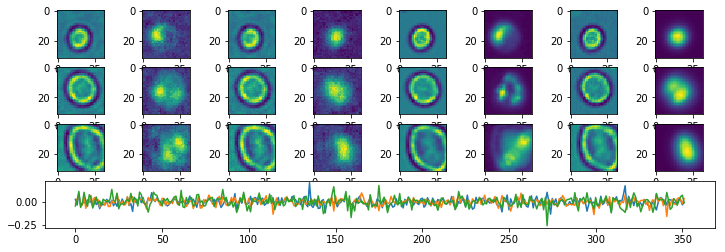

Epoch:  26 Iteration:  0 Loss:  4.14826 0.630334 0.000704318


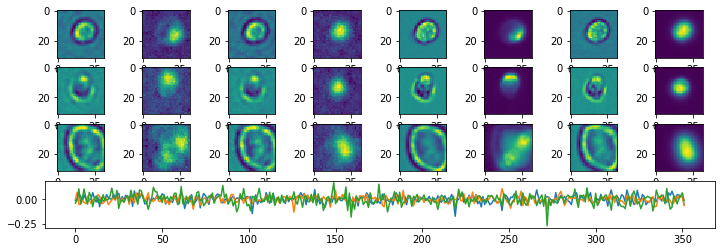

Epoch:  27 Iteration:  0 Loss:  4.08107 0.630299 0.000221103


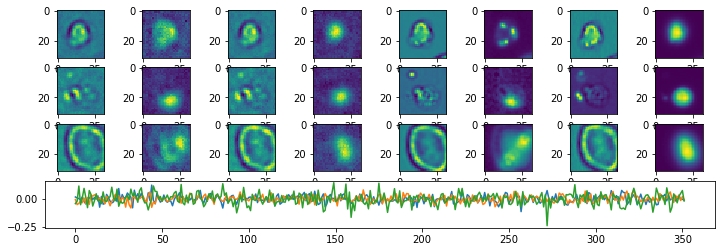

Epoch:  28 Iteration:  0 Loss:  3.98138 0.630246 0.00040096


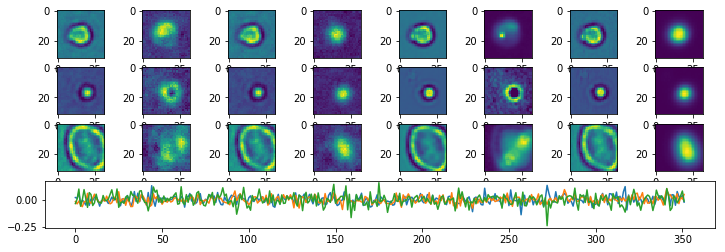

Epoch:  29 Iteration:  0 Loss:  3.94566 0.630227 0.000722855


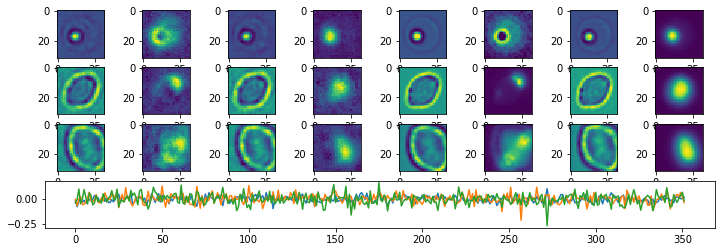

Epoch:  30 Iteration:  0 Loss:  3.8811 0.630193 0.000474602


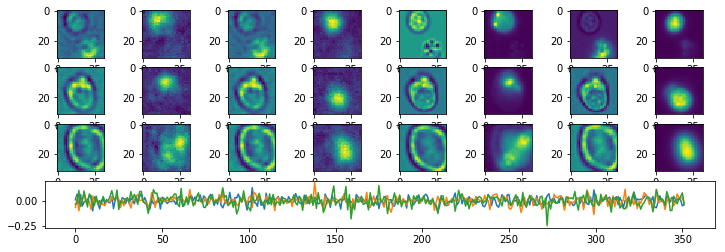

Epoch:  31 Iteration:  0 Loss:  3.86794 0.630187 0.000640213


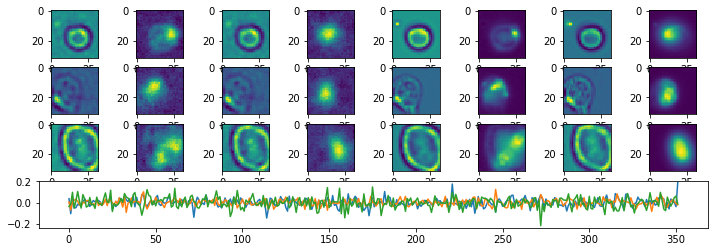

Epoch:  32 Iteration:  0 Loss:  3.76314 0.630131 0.000863522


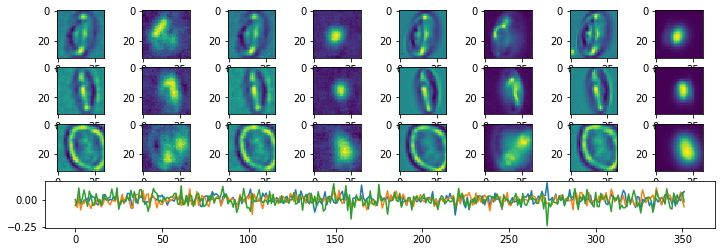

Epoch:  33 Iteration:  0 Loss:  3.6986 0.630097 0.000654131


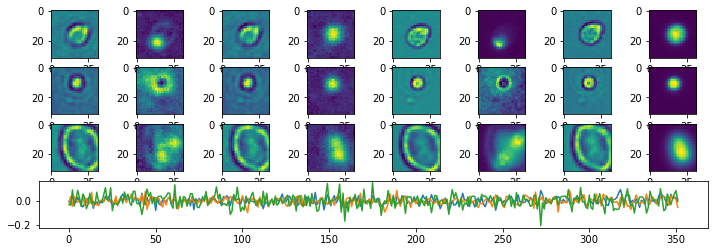

Epoch:  34 Iteration:  0 Loss:  3.71002 0.630103 0.000781834


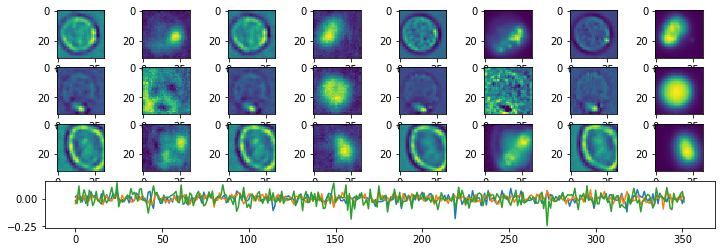

Epoch:  35 Iteration:  0 Loss:  3.6698 0.630084 0.000469446


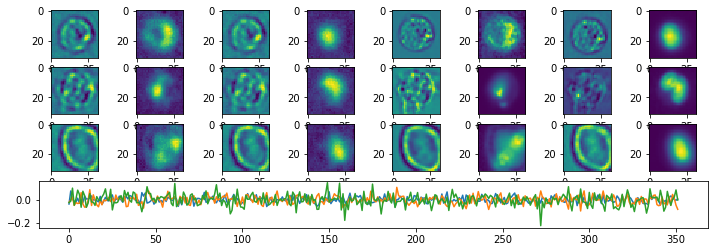

Epoch:  36 Iteration:  0 Loss:  3.55655 0.630022 0.000690579


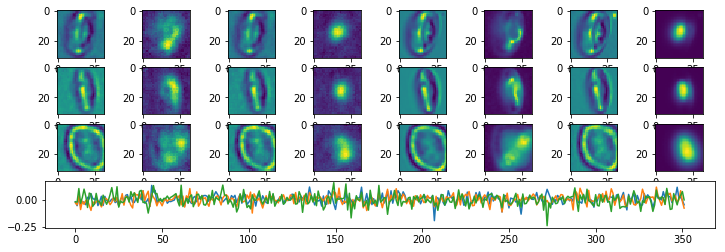

Epoch:  37 Iteration:  0 Loss:  3.5021 0.629994 0.000278264


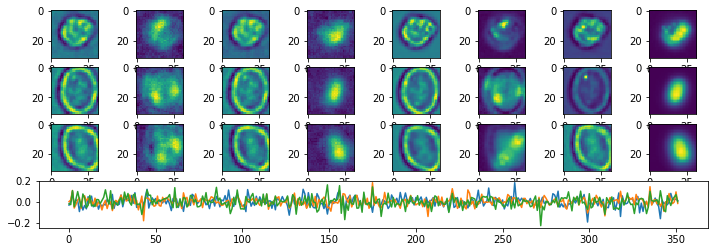

Epoch:  38 Iteration:  0 Loss:  3.42924 0.629957 0.000776827


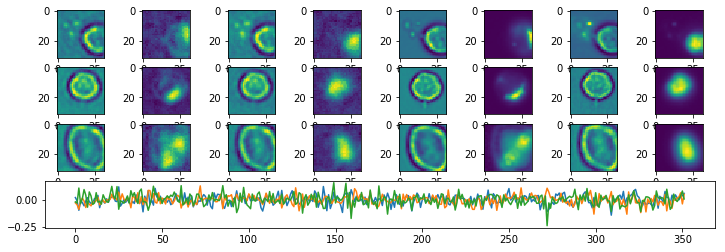

Epoch:  39 Iteration:  0 Loss:  3.38832 0.629935 0.000626147


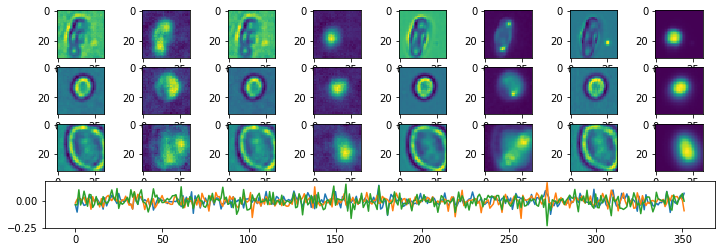

Epoch:  40 Iteration:  0 Loss:  3.33391 0.629908 0.000244677


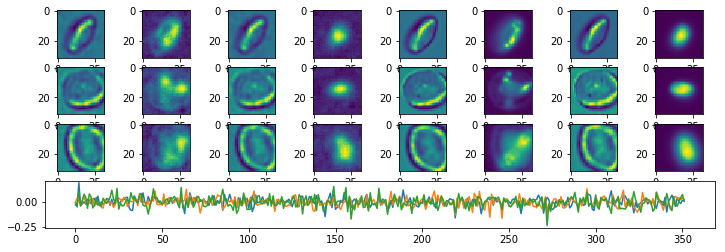

Epoch:  41 Iteration:  0 Loss:  3.29928 0.62989 0.000360638


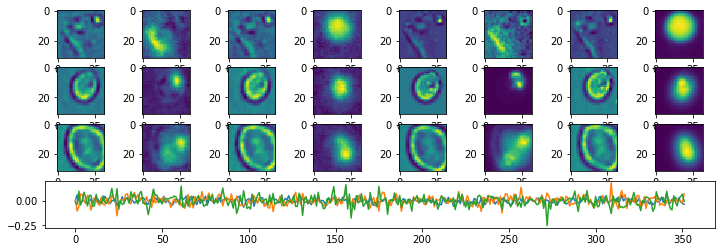

Epoch:  42 Iteration:  0 Loss:  3.27809 0.629881 0.000258565


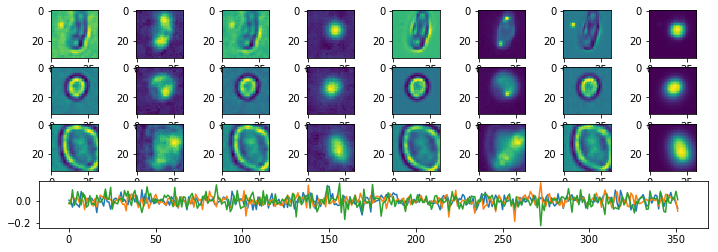

Epoch:  43 Iteration:  0 Loss:  3.19315 0.629835 0.000340372


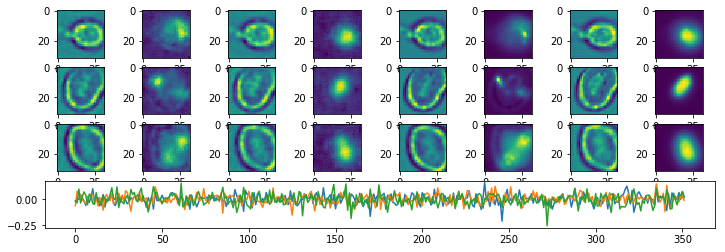

Epoch:  44 Iteration:  0 Loss:  3.17505 0.629827 0.000441611


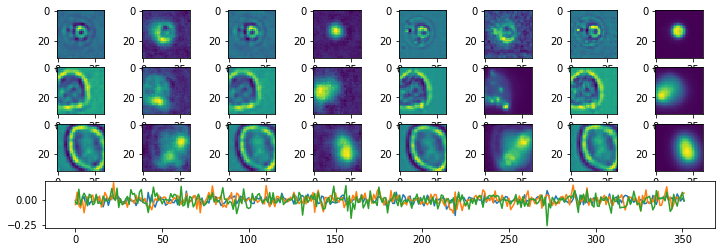

Epoch:  45 Iteration:  0 Loss:  3.10154 0.629787 0.00046289


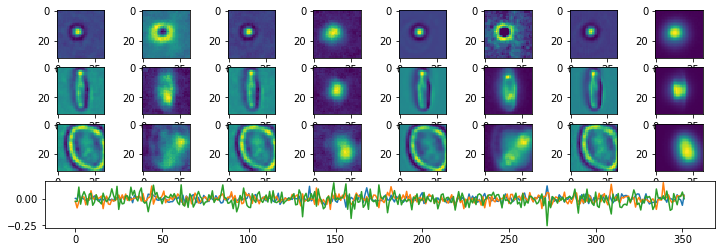

Epoch:  46 Iteration:  0 Loss:  3.05741 0.629765 0.000244707


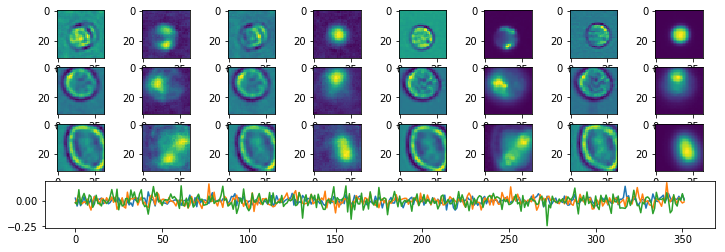

Epoch:  47 Iteration:  0 Loss:  3.03592 0.629754 0.000446111


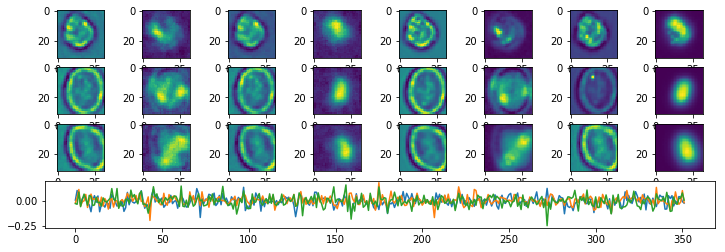

Epoch:  48 Iteration:  0 Loss:  3.00908 0.629741 0.00031811


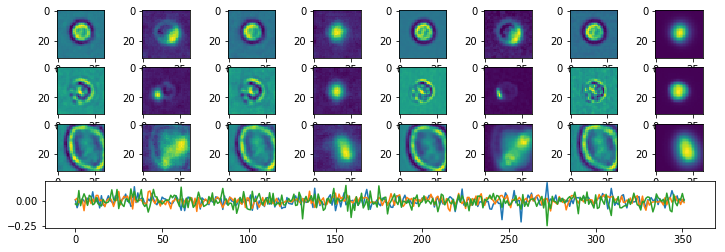

Epoch:  49 Iteration:  0 Loss:  2.99302 0.629731 0.000767052


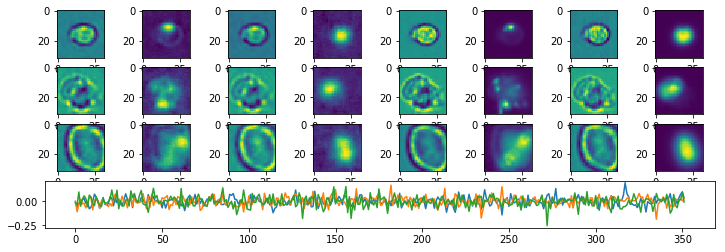

Epoch:  50 Iteration:  0 Loss:  2.97729 0.629726 0.000268012


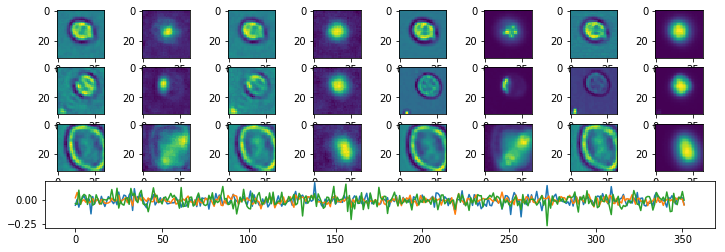

Epoch:  51 Iteration:  0 Loss:  2.90386 0.629688 0.000495046


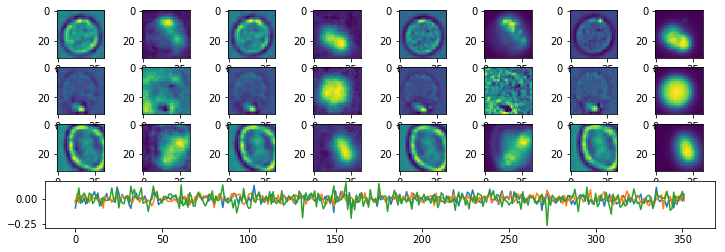

Epoch:  52 Iteration:  0 Loss:  2.86818 0.629669 0.000426888


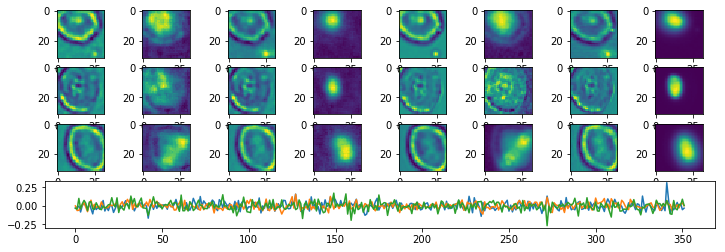

Epoch:  53 Iteration:  0 Loss:  2.82163 0.629644 0.000751764


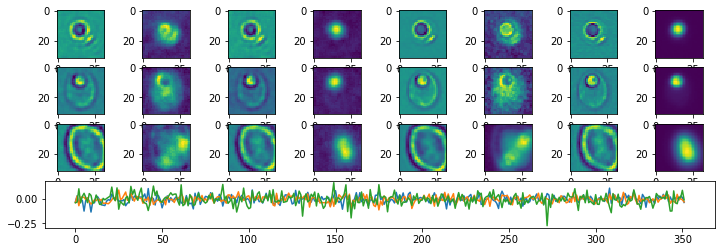

Epoch:  54 Iteration:  0 Loss:  2.79858 0.629632 0.000441581


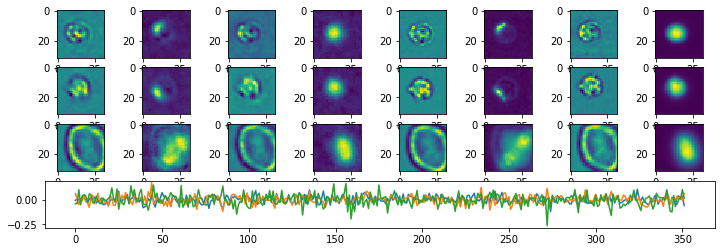

Epoch:  55 Iteration:  0 Loss:  2.7551 0.62961 0.00036332


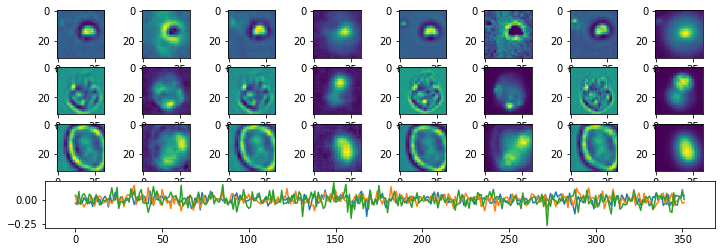

Epoch:  56 Iteration:  0 Loss:  2.70755 0.629586 0.000142097


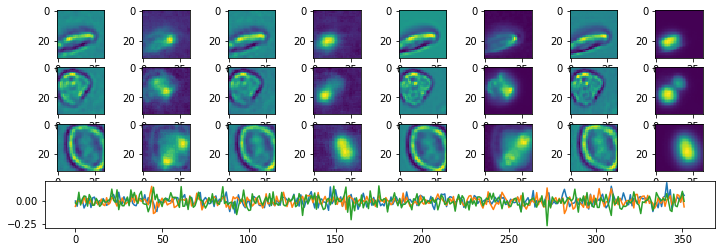

Epoch:  57 Iteration:  0 Loss:  2.70795 0.629586 0.000596017


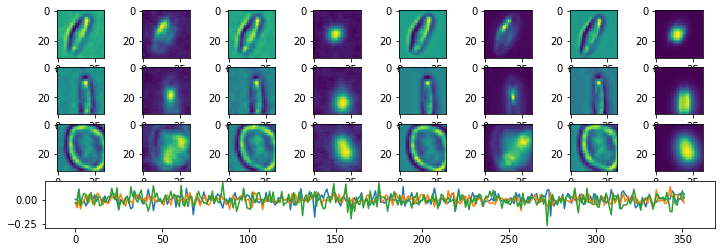

Epoch:  58 Iteration:  0 Loss:  2.67194 0.629571 0.000252903


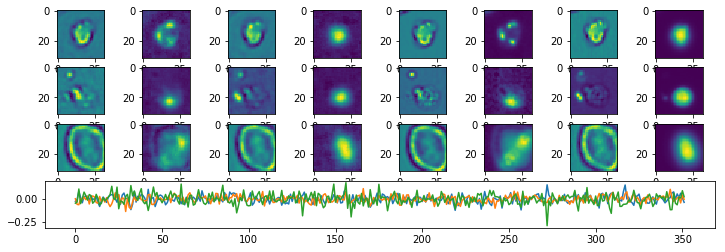

Epoch:  59 Iteration:  0 Loss:  2.64779 0.629554 0.00031212


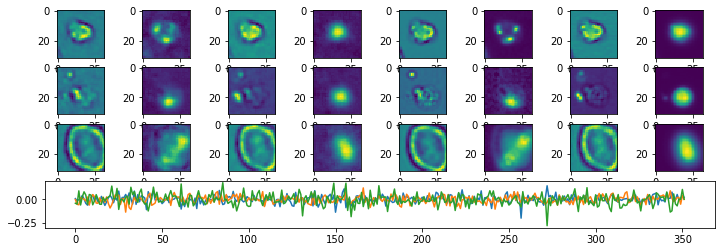

Epoch:  60 Iteration:  0 Loss:  2.63678 0.629549 0.000280857


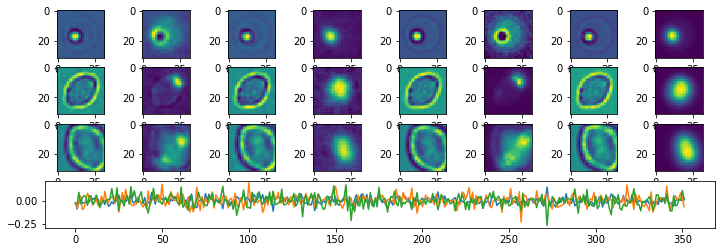

Epoch:  61 Iteration:  0 Loss:  2.62492 0.629546 3.43323e-05


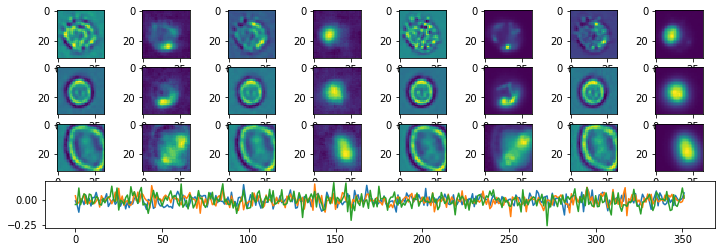

Epoch:  62 Iteration:  0 Loss:  2.57349 0.629526 0.000290692


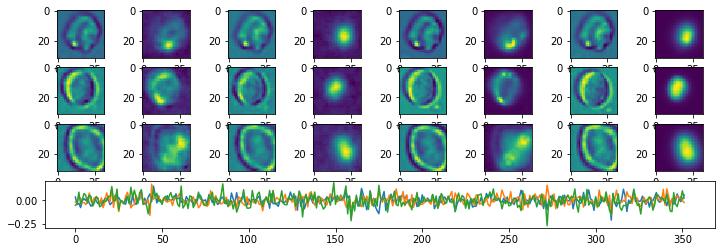

Epoch:  63 Iteration:  0 Loss:  2.54441 0.629502 0.000355661


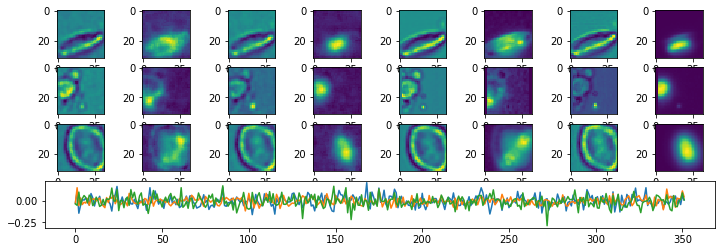

Epoch:  64 Iteration:  0 Loss:  2.52003 0.62949 0.000380099


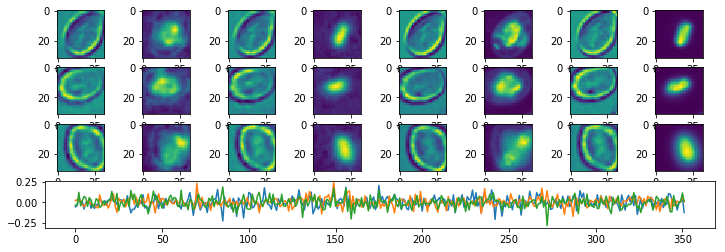

Epoch:  65 Iteration:  0 Loss:  2.49177 0.629475 0.000289738


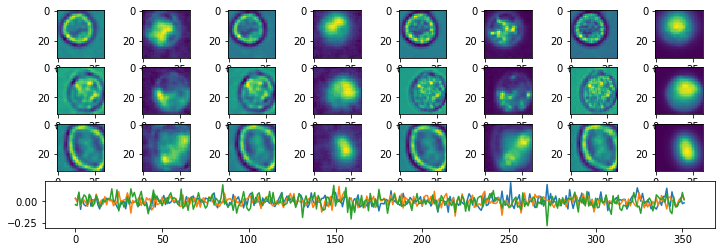

Epoch:  66 Iteration:  0 Loss:  2.54199 0.629502 0.000911206


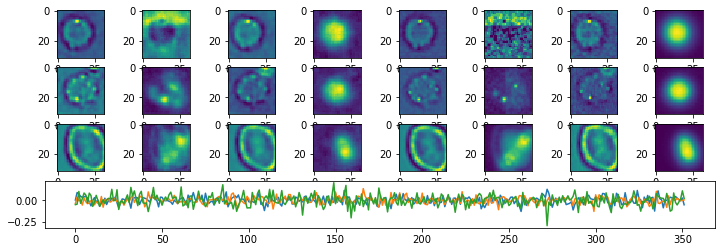

Epoch:  67 Iteration:  0 Loss:  2.45188 0.629455 0.000345051


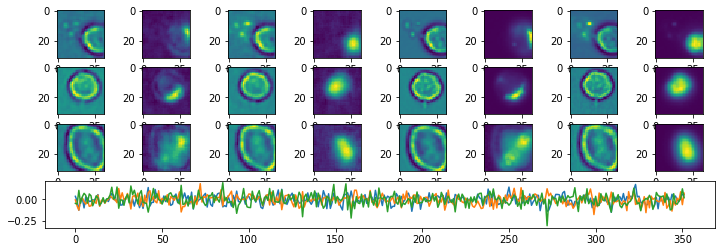

Epoch:  68 Iteration:  0 Loss:  2.45235 0.629455 0.000240654


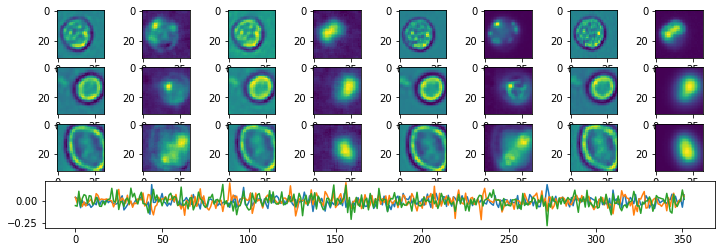

Epoch:  69 Iteration:  0 Loss:  2.44117 0.629449 0.00057888


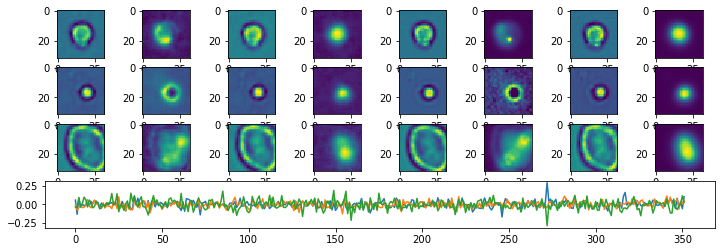

Epoch:  70 Iteration:  0 Loss:  2.43078 0.629443 9.26554e-05


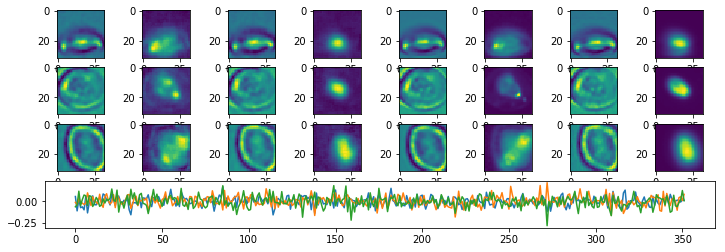

Epoch:  71 Iteration:  0 Loss:  2.40831 0.629432 0.000257432


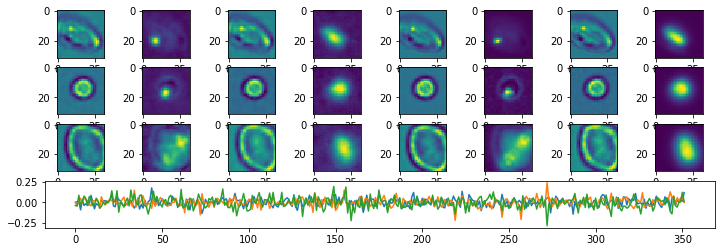

Epoch:  72 Iteration:  0 Loss:  2.39023 0.629422 0.000375092


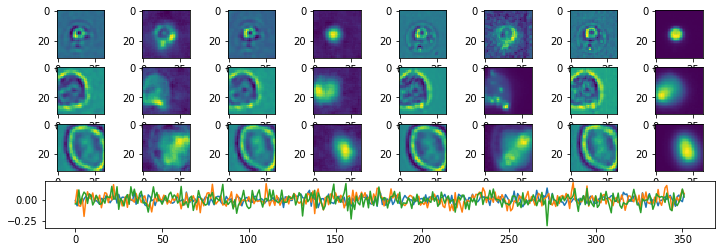

Epoch:  73 Iteration:  0 Loss:  2.38611 0.629426 0.000369787


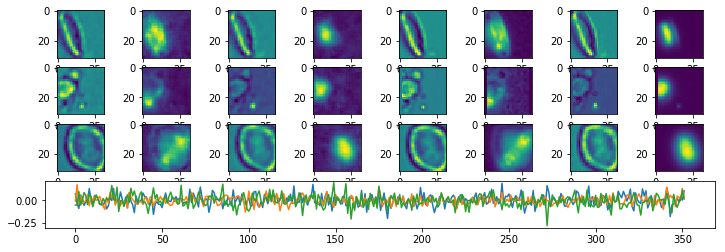

Epoch:  74 Iteration:  0 Loss:  3.03266 0.62976 0.000406176


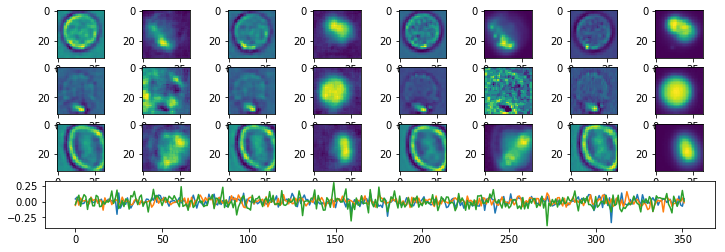

Epoch:  75 Iteration:  0 Loss:  2.55114 0.629506 0.000280946


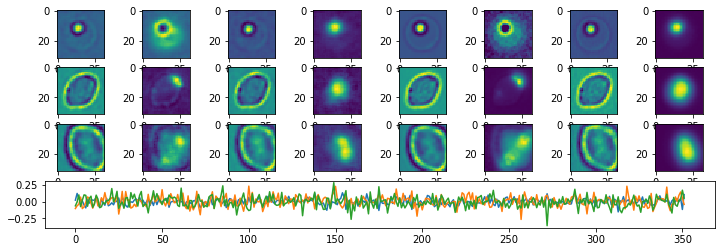

Epoch:  76 Iteration:  0 Loss:  2.48711 0.629472 0.000288069


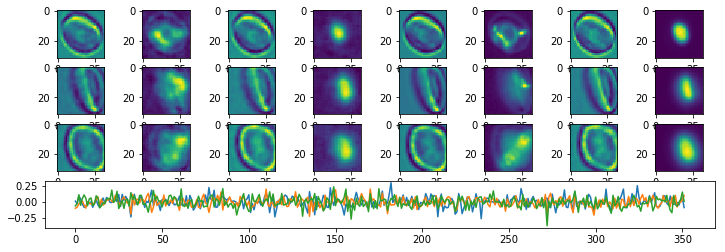

Epoch:  77 Iteration:  0 Loss:  2.44278 0.629449 0.00031662


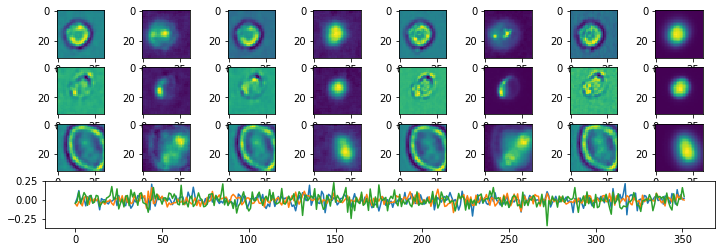

Epoch:  78 Iteration:  0 Loss:  2.41695 0.629435 0.000281513


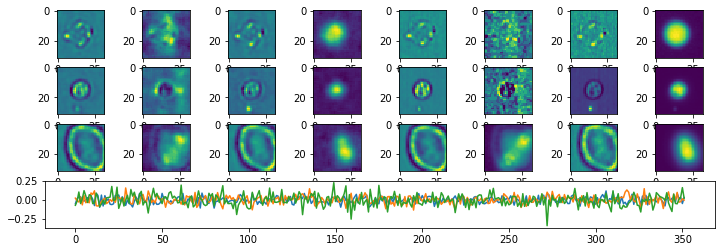

Epoch:  79 Iteration:  0 Loss:  2.37988 0.629422 0.000267744


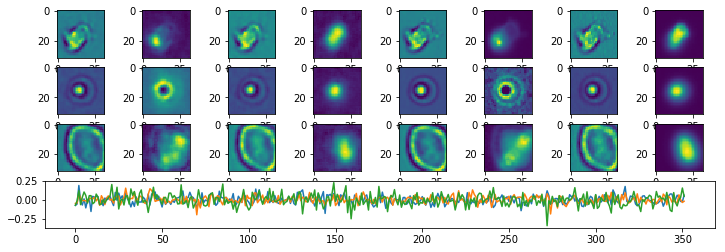

Epoch:  80 Iteration:  0 Loss:  2.38626 0.62942 0.000260413


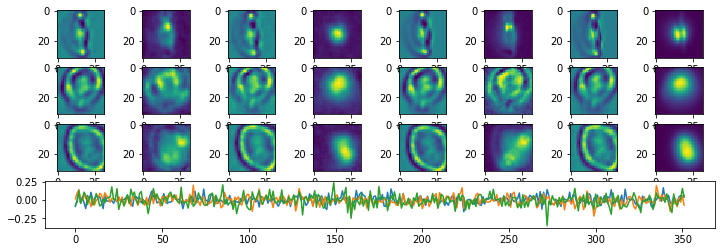

Epoch:  81 Iteration:  0 Loss:  2.36726 0.629412 0.000294566


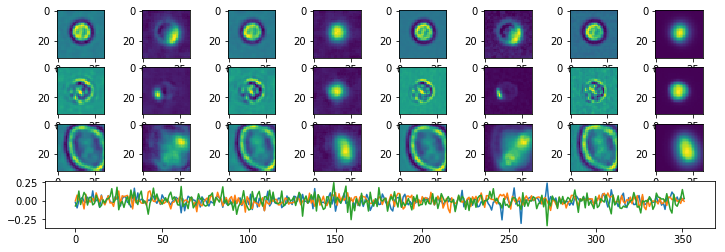

Epoch:  82 Iteration:  0 Loss:  2.36087 0.629407 0.000268608


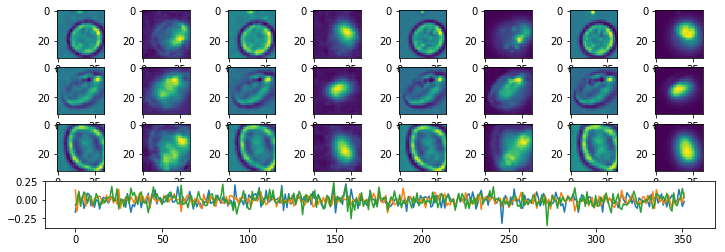

Epoch:  83 Iteration:  0 Loss:  2.34551 0.6294 0.000235587


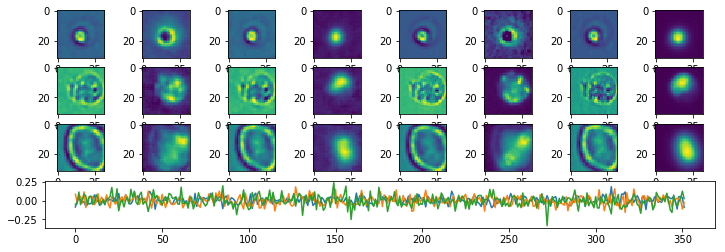

Epoch:  84 Iteration:  0 Loss:  2.35847 0.629405 0.000316888


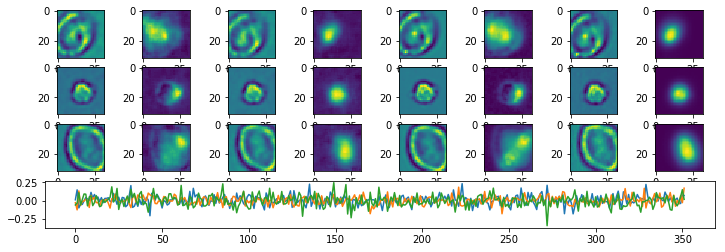

Epoch:  85 Iteration:  0 Loss:  2.32595 0.629389 0.000354469


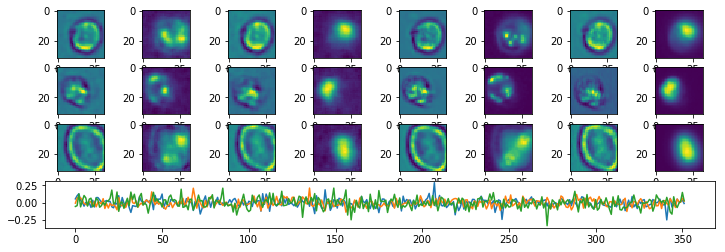

Epoch:  86 Iteration:  0 Loss:  2.33289 0.629392 0.000278533


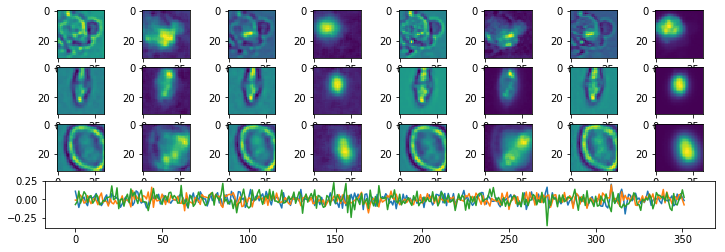

Epoch:  87 Iteration:  0 Loss:  2.30835 0.629381 0.00012517


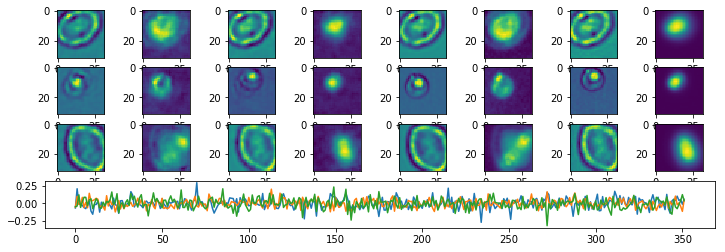

Epoch:  88 Iteration:  0 Loss:  2.31471 0.629384 0.000321537


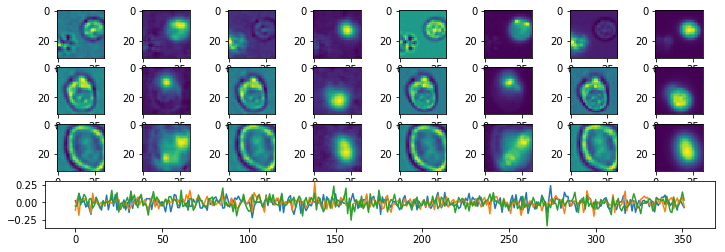

Epoch:  89 Iteration:  0 Loss:  2.30953 0.62938 2.03252e-05


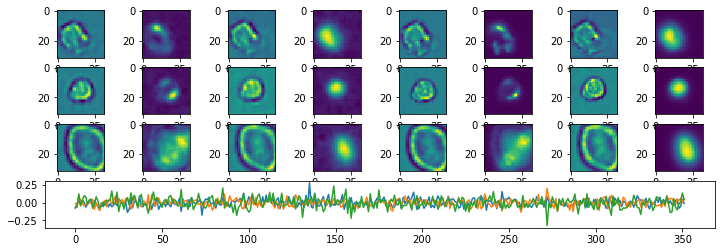

Epoch:  90 Iteration:  0 Loss:  2.31606 0.629388 0.000245482


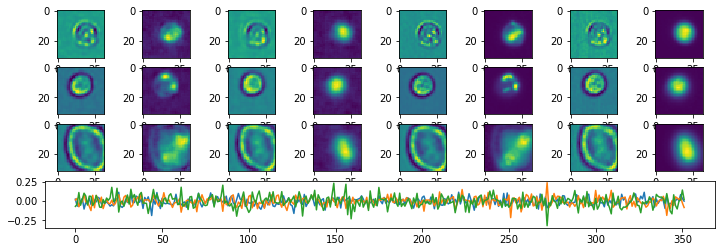

Epoch:  91 Iteration:  0 Loss:  2.28754 0.629368 0.000412077


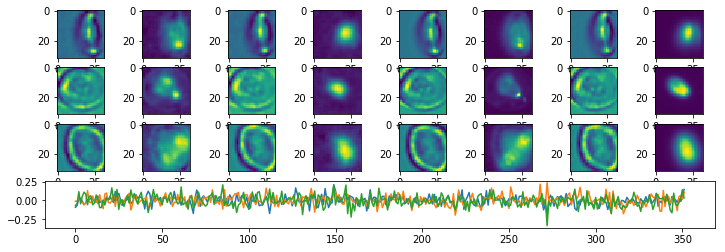

Epoch:  92 Iteration:  0 Loss:  2.29495 0.629372 0.00029102


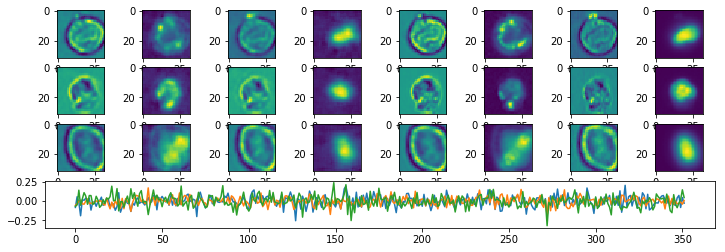

Epoch:  93 Iteration:  0 Loss:  2.2761 0.629363 3.5882e-05


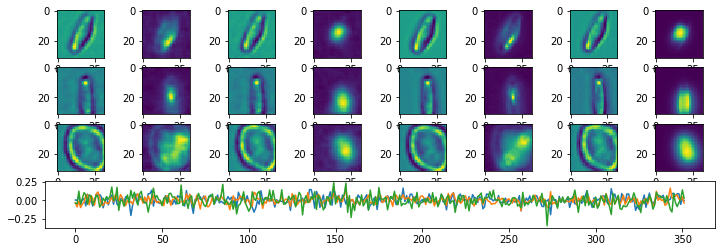

Epoch:  94 Iteration:  0 Loss:  2.25028 0.62935 5.6982e-05


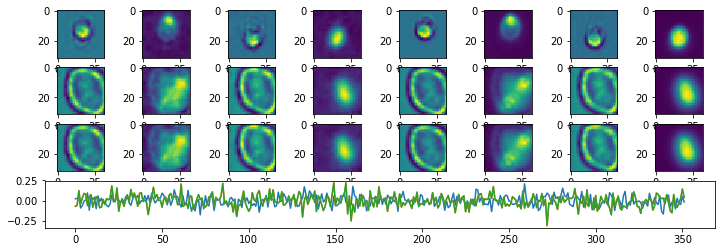

Epoch:  95 Iteration:  0 Loss:  2.2719 0.629361 0.000434428


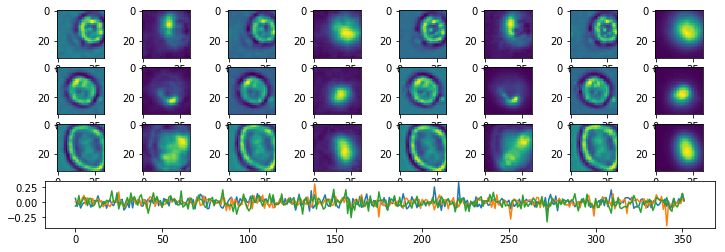

Epoch:  96 Iteration:  0 Loss:  2.26418 0.62936 0.000457942


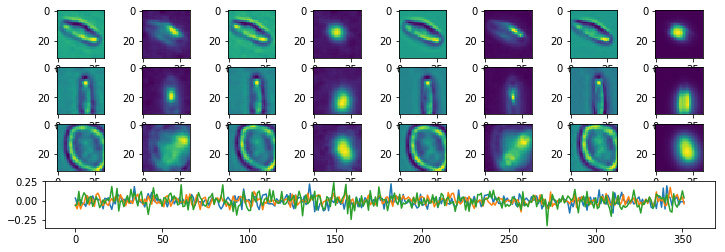

Epoch:  97 Iteration:  0 Loss:  2.25454 0.629352 0.000202119


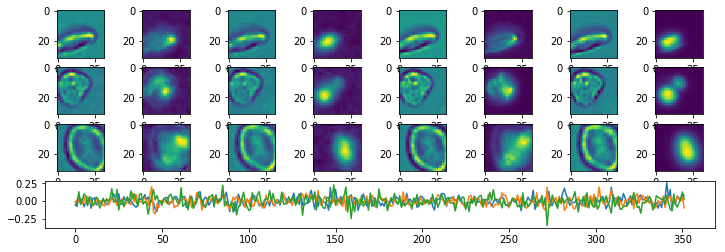

Epoch:  98 Iteration:  0 Loss:  2.23808 0.629343 0.000101924


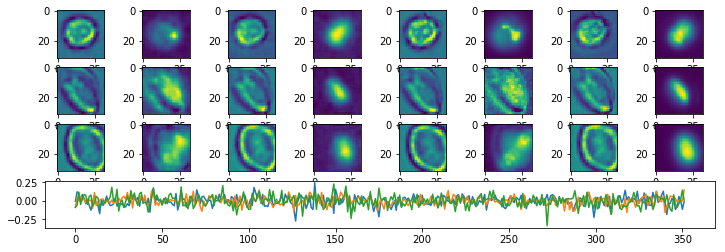

Epoch:  99 Iteration:  0 Loss:  2.24523 0.629348 0.000274539


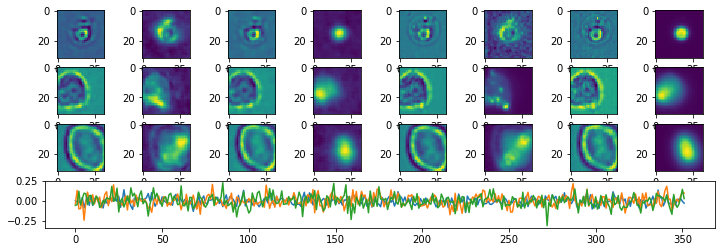

Epoch:  100 Iteration:  0 Loss:  2.23823 0.629342 0.000508189


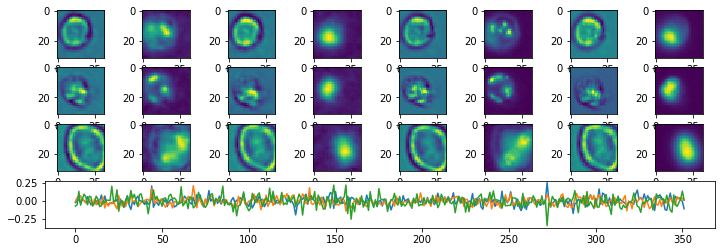

Epoch:  101 Iteration:  0 Loss:  2.219 0.629333 0.000233114


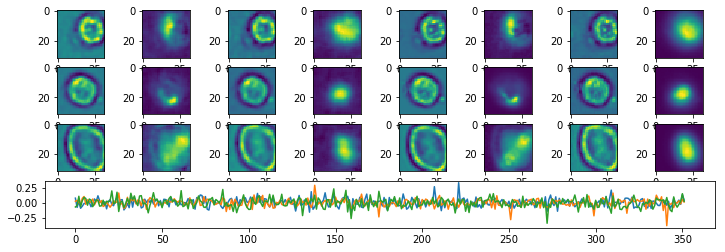

Epoch:  102 Iteration:  0 Loss:  2.21229 0.629329 0.000267953


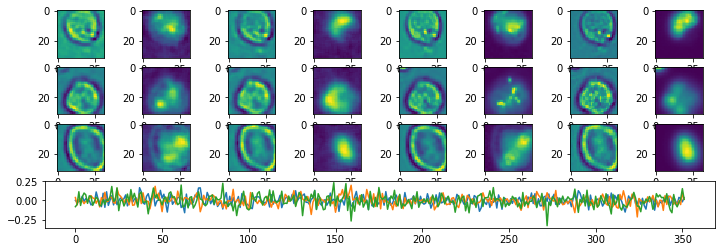

Epoch:  103 Iteration:  0 Loss:  2.19916 0.629324 0.000377953


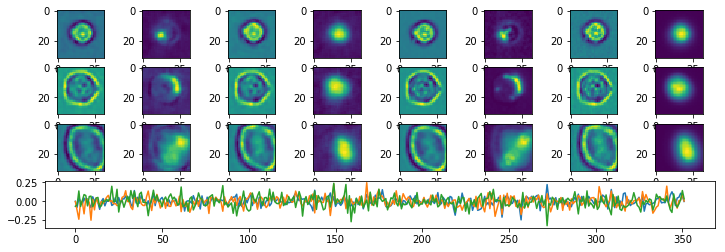

Epoch:  104 Iteration:  0 Loss:  2.19536 0.62932 6.79791e-05


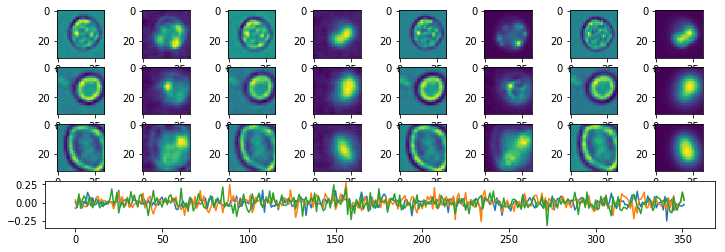

Epoch:  105 Iteration:  0 Loss:  2.20053 0.629326 0.000522405


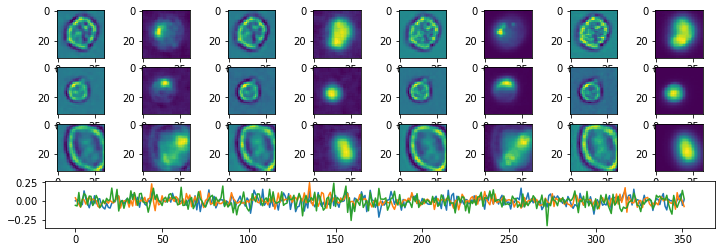

Epoch:  106 Iteration:  0 Loss:  2.17832 0.629311 0.000284612


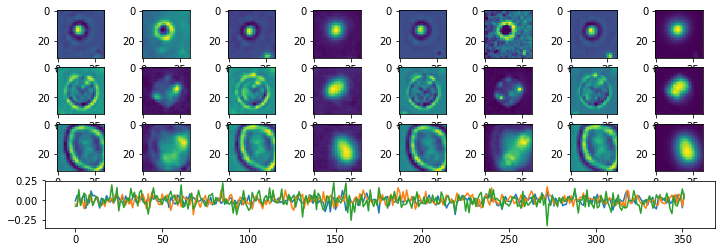

Epoch:  107 Iteration:  0 Loss:  3.6203 0.630074 0.000765592


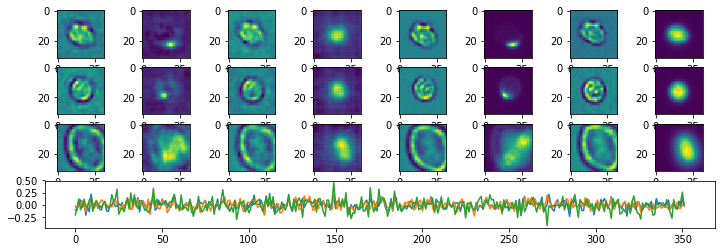

Epoch:  108 Iteration:  0 Loss:  2.78743 0.62963 0.00033012


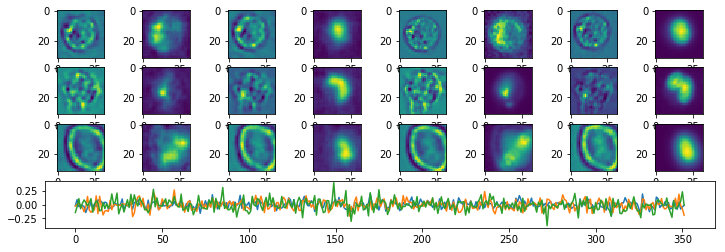

Epoch:  109 Iteration:  0 Loss:  2.60596 0.629536 0.000258863


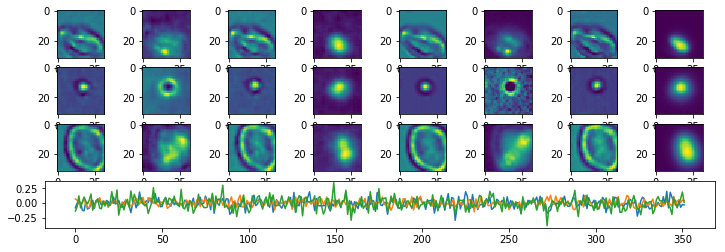

Epoch:  110 Iteration:  0 Loss:  2.50078 0.62948 0.000215262


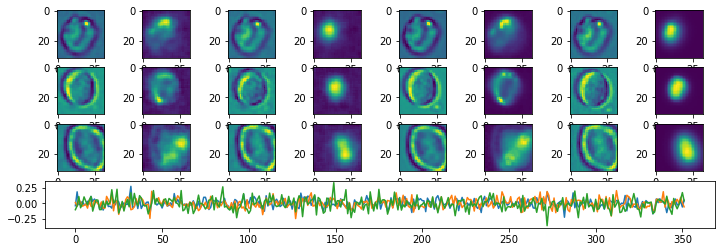

Epoch:  111 Iteration:  0 Loss:  2.43272 0.62945 0.00031957


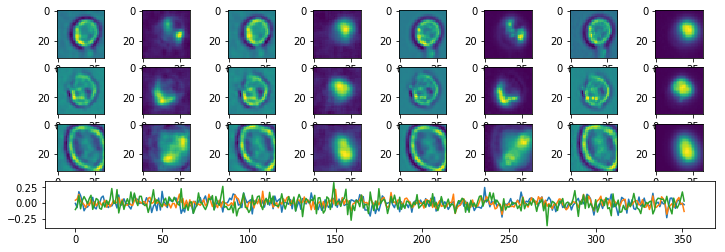

Epoch:  112 Iteration:  0 Loss:  2.38518 0.629424 0.000329167


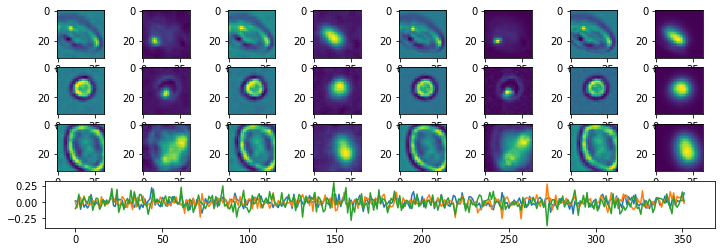

Epoch:  113 Iteration:  0 Loss:  2.35713 0.629409 0.000329643


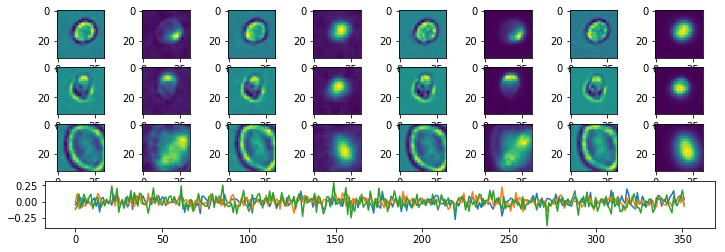

Epoch:  114 Iteration:  0 Loss:  2.31557 0.629387 0.000283092


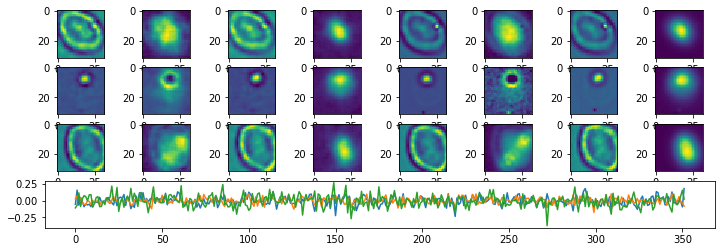

Epoch:  115 Iteration:  0 Loss:  2.3013 0.629376 0.000362873


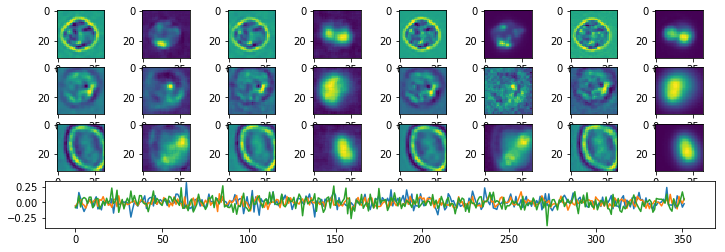

Epoch:  116 Iteration:  0 Loss:  2.28424 0.62937 0.000202626


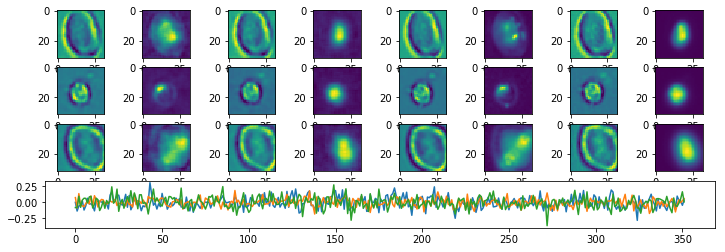

Epoch:  117 Iteration:  0 Loss:  2.26764 0.629362 0.000265062


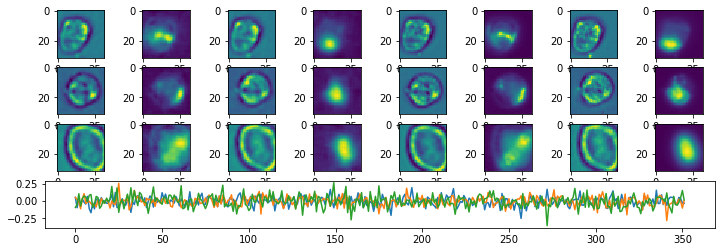

Epoch:  118 Iteration:  0 Loss:  2.26105 0.629359 0.000222772


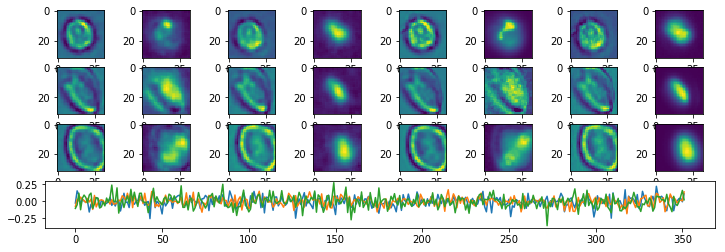

Epoch:  119 Iteration:  0 Loss:  2.25103 0.629353 0.000209659


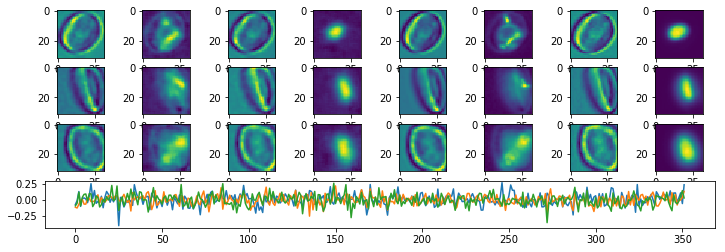

Done


In [8]:

p_mmdict = mmdict #{"Fish6_15_cjw_64.tif.mm": m3}
#             "plate04_all.mm": m4}

p_width = 32
p_height = 32
p_nchannels = 4
p_channels = [0,1,3,4]
p_nepochs = 120
p_batchsize = 128
p_learning_rate = 0.0001  #.00005
p_restore = False
p_latent_size = 352 #128 + 64
p_droprate = 0.95
p_stdev = .04

enc_sizes = [(128, 3), (256, 3), (512, 3)]  #128, 3)]
######enc_sizes = [(64, 3), (128, 3), (256,3), (512,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
#enc_sizes = [(16, 5), (32, 3), (64,3), (128,3)] #, (64, 3), (128,3)] #, (32, 3), (64, 3)]
dec_sizes = list(reversed(enc_sizes))
#dec_sizes.append((p_nchannels,7))

params = dict()

params['width'] = p_width
params['height'] = p_height
params['nchannels'] = p_nchannels
params['channels'] = p_channels
params['nepochs'] = p_nepochs
params['batchsize'] = p_batchsize
params['learning_rate'] = p_learning_rate
params['restore'] = p_restore
params['latent_size'] = p_latent_size
params['droprate'] = p_droprate
params['stdev'] = p_stdev

params['enc_sizes'] = enc_sizes
params['dec_sizes'] = dec_sizes

cpdir = "/media/cjw/Data/cyto/Checkpoints/2018-04-26-LS352"

if not os.path.exists(cpdir):
    os.makedirs(cpdir)
autoencoder_train.train(p_mmdict, p_df, params, 500, cpdir)

In [7]:
x = 4
x

4